### LAB 3

#### Expt 3.1 Effect of transmit power on speech quality [8 marks]
Write a Python program to read the narrowband speech from 'NarrobandSpeech8k.wav' and
to play out the sound without bit-errors. 

Write a function that calculates the bit-error
probability (beP) for any given value of Eb/No (in dB), when the modulation technique is
binary FSK. 

Check that your function gives the same bit-error probability for Eb/N0 = 8.9 dB
as was obtained in Lecture LS_5. for a transmission power of 1 watt.

Remember that it was assumed that the bit-rate is 128kb/s, there is a 50 dB power loss over the channel from
transmitter to receiver and that the noise at the receiver has a power spectral density N0 =
1010-12 watts per Hz.

Assume that these 3 parameters remain unchanged in Expt 3.1. 

In [1]:
import numpy as np
from scipy.io import wavfile
import scipy
from scipy import special
from IPython import display as Dp
import matplotlib.pyplot as plt

print("Narrow Band Speech - Without Bit Errors")
(Fs, speech) = wavfile.read("NarrobandSpeech8k.wav")
Dp.display(Dp.Audio(speech,rate=Fs))

def bitErrorProb(EbN0):
    EbN0SQRT = scipy.sqrt(EbN0)
    beP = 0.5 * special.erfc(EbN0SQRT)
    return beP

#Convert to non db form 
ratio1 = 10**(8.9/10)
print("Bit Error Prob for Eb/N0 = 8.9 | ", bitErrorProb(ratio1))
print("Bit Error Prob for Lecture 5 | ", str(4*10**-5) )

    


Narrow Band Speech - Without Bit Errors


Bit Error Prob for Eb/N0 = 8.9 |  4.07118856467283e-05
Bit Error Prob for Lecture 5 |  4e-05


Narrow Band Speech - With Bit Errors


b'NarrobandSpeech8k.wav\t speechBack.wav\t 3.449\t 3.483\t 8000\tnb\n'
PESQ FOR 1Watt transmission: 3.449


Text(0.5, 1.0, 'Waterfall Graph')

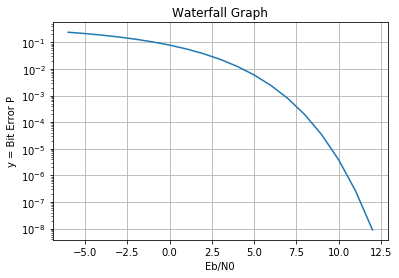

In [2]:
def numpyint16array_to_bitarray(D):       
    return np.unpackbits(bytearray(D.byteswap()))

def insert_bit_errors(data, bit_error_probability):
    # Insert bit errors into some data with given probability.
    errors = np.random.uniform(size=data.size) < bit_error_probability
    return errors ^ data

def bitarray_to_numpyint16array(data):
    NA=np.packbits(data)
    NA=NA.tobytes()
    NA=np.frombuffer(NA, dtype=np.int16)
    NA=NA.byteswap()
    return NA

speechBitArray = numpyint16array_to_bitarray(speech)
speechBitArrayErrors = insert_bit_errors(speechBitArray, bitErrorProb(ratio1))
speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)

print("Narrow Band Speech - With Bit Errors")
Dp.display(Dp.Audio(speechBack,rate=Fs))


##### PESQ
wavfile.write("speechBack.wav",Fs, speechBack)
! ./macos_pesq +8000 NarrobandSpeech8k.wav speechBack.wav > /dev/null

def read_pesq_score():
    import os
    if os.path.exists("pesq_results.txt"):
        f = open ("pesq_results.txt","rb")
        firstline = f.readline()  # Ignore this line
        secondline = f.readline()
        print(secondline)
        s = secondline.split()
        score = float(s[2])  # score is 2nd entry of 2nd line
        f.close()
        os.remove("pesq_results.txt")   # Delete text file
    else:
        print("There are no results from presq_main")
        score=0.0
    return score

value = read_pesq_score()
print("PESQ FOR 1Watt transmission:", value)


EbN0 = [0]*19
for i in range(19):
    EbN0[i] = i-6
    
bEp = [0]*19
inSample = [0]*19
for i in range(19):
    inDb = i-6
    inSample[i] = 10**(inDb/10)
    bEp[i] = bitErrorProb(inSample[i])
    

#EB NO IS FINE values -6 - 12
fig, ax0 = plt.subplots(1) 
ax0.plot(EbN0, bEp)
ax0.set_yscale('log')
ax0.set_xlabel("Eb/N0") ; ax0.set_ylabel("y = Bit Error P")
ax0.grid(True) ; ax0.set_title("Waterfall Graph")
    
  
    

In [3]:
# For 1.2 Watts the speech will be affected as followes

EbN0 = (9.375*10**-11) / (10*10**-12)
print("EbN0: 1.2W | ", EbN0)

bitError2 = bitErrorProb(EbN0)
print("Bit Error Prob: 1.2W | ", bitError2)


speechBitArray = numpyint16array_to_bitarray(speech)
speechBitArrayErrors = insert_bit_errors(speechBitArray, bitError2)
speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)

print("Narrow Band Speech - With Bit Errors")
Dp.display(Dp.Audio(speechBack,rate=Fs))
wavfile.write("speechBack.wav",Fs, speechBack)
    
##### PESQ
! ./macos_pesq +8000 NarrobandSpeech8k.wav speechBack.wav > /dev/null
value = read_pesq_score()
print("PESQ FOR 1.2Watt transmission:", value)

##### Talk time with 1.2Watts

Battery = 18000
PowerJs_1 = 1.2
Talktime = Battery/PowerJs_1
print("Talktime: ", (str(Talktime) + "s"), " [Original for 1.2 was 18000.0s]")

EbN0: 1.2W |  9.375
Bit Error Prob: 1.2W |  7.451167896213846e-06
Narrow Band Speech - With Bit Errors


b'NarrobandSpeech8k.wav\t speechBack.wav\t 4.088\t 4.238\t 8000\tnb\n'
PESQ FOR 1.2Watt transmission: 4.088
Talktime:  15000.0s  [Original for 1.2 was 18000.0s]


#### 1. How was the value of Eb/N0 calculated for a transmission power of 1 watt in Lecture LS_5 ? Did your function give the same value of beP?. 
By calculating the Joules ber bit(Energy per second divided by Bits Per Second) Then the ratio of noise spectral density to the signal power can be calculated. 

Yes my function within a range of 2SigFig gave the same value.

#### 2. What are the new values of Eb/N0 and beP when the transmission power is increased to 1.2 watts?
EbN0: 1.2W |  9.375
Bit Error Prob: 1.2W |  7.451167896213846e-06

#### 3. What is the PESQ score for the narrowband speech transmitted with 1.2 watts?
PESQ FOR 1.2Watt transmission: 4.231


#### 4. How is the talk time affected?
Decreases. More power used for each second to send each bit.

#### 5. Explain in about one sentence how battery life and bit-error rates are connected.
Bit error rate can be reduced by increasing the power, which decreases battery life - therefore they are directly proportional.


#### 6. What is the quality of speech obtained when beP = 1? Explain your answer.
Essentially it is 0 PESQ and completely untelligable as every bit has the probability of 1 ie true to have an error inserted.


### Expt 3.2: Effect of beP on narrow-band speech without FEC

Demonstrate the effect of introducing evenly distributed bit-errors on narrow-band speech.

Generate 13 versions of the speech file ‘Narroband8kspeech.wav’, with gradually increasing

bit-error probability, starting from 0.00001 and ending at 0.01. Use a logarithmic scale for
the increasing bit-error probability. For each value of bit-error probability, your program

should produce a correctly labelled sound-bar for playing out the damaged speech and it

should be compared, using the PESQ software tool, with an error-free version with exactly
the same number of samples. 

Narrow Band Speech - With Bit Errors, : 1e-05  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 3.785\t 3.920\t 8000\tnb\n'
PESQ SCORE: 3.785
Narrow Band Speech - With Bit Errors, : 0.0007784615384620001  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.421\t 1.292\t 8000\tnb\n'
PESQ SCORE: 1.421
Narrow Band Speech - With Bit Errors, : 0.0015469230769240001  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.317\t 1.253\t 8000\tnb\n'
PESQ SCORE: 1.317
Narrow Band Speech - With Bit Errors, : 0.002315384615386  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.348\t 1.264\t 8000\tnb\n'
PESQ SCORE: 1.348
Narrow Band Speech - With Bit Errors, : 0.003083846153848  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.419\t 1.291\t 8000\tnb\n'
PESQ SCORE: 1.419
Narrow Band Speech - With Bit Errors, : 0.0038523076923100003  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.454\t 1.306\t 8000\tnb\n'
PESQ SCORE: 1.454
Narrow Band Speech - With Bit Errors, : 0.004620769230772001  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.451\t 1.305\t 8000\tnb\n'
PESQ SCORE: 1.451
Narrow Band Speech - With Bit Errors, : 0.005389230769234001  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.489\t 1.321\t 8000\tnb\n'
PESQ SCORE: 1.489
Narrow Band Speech - With Bit Errors, : 0.006157692307696002  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.499\t 1.325\t 8000\tnb\n'
PESQ SCORE: 1.499
Narrow Band Speech - With Bit Errors, : 0.006926153846158002  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.487\t 1.320\t 8000\tnb\n'
PESQ SCORE: 1.487
Narrow Band Speech - With Bit Errors, : 0.007694615384620003  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.487\t 1.320\t 8000\tnb\n'
PESQ SCORE: 1.487
Narrow Band Speech - With Bit Errors, : 0.008463076923082003  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.486\t 1.320\t 8000\tnb\n'
PESQ SCORE: 1.486
Narrow Band Speech - With Bit Errors, : 0.009231538461544004  - Probability


b'NarrobandSpeech8k.wav\t speechBack.wav\t 1.484\t 1.319\t 8000\tnb\n'
PESQ SCORE: 1.484


Text(0.5, 1.0, 'Waterfall Graph')

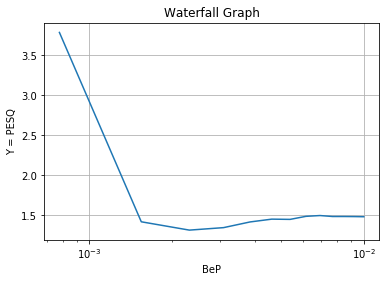

In [4]:
speechBitArray = numpyint16array_to_bitarray(speech)
speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)

logVar = 0.00001
logVariables = [0]*13
PESQScores = [0]*13

for i in range(13):
    speechBitArrayErrors = insert_bit_errors(speechBitArray, logVar)
    speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)
    print("Narrow Band Speech - With Bit Errors, :", logVar, " - Probability")
    wavfile.write("speechBack.wav",Fs, speechBack)
    Dp.display(Dp.Audio(speechBack,rate=Fs))
    logVar = logVar + 0.000768461538462
    
    # For graphing later
    logVariables[i] = logVar
    ! ./macos_pesq +8000 NarrobandSpeech8k.wav speechBack.wav > /dev/null
    value = read_pesq_score()
    print("PESQ SCORE:", value)
    
    
    PESQScores[i] = value
    
#EB NO IS FINE values -6 - 12
fig, ax0 = plt.subplots(1) 
ax0.plot(logVariables, PESQScores)
ax0.set_xscale('log')
ax0.set_xlabel("BeP") ; ax0.set_ylabel("Y = PESQ")
ax0.grid(True) ; ax0.set_title("Waterfall Graph")
    
    
#Plot logVairiables Againts PesQ scores (Linear) and format to logarithmic scale 
    
    
    

#### 1. How did you choose the values of beP to produce a logarithmic horizontal scale?.

By working out the equal 13 increments0.00001 and ending at 0.01. and then plotted these on a matplot log scale

#### 2. How do the changes in beP affect the quality of the sound as you listen to it?
As beP increases the level of noise (crackling aka static) increases. At 0.00001 it is almost neglible however by 0.01 it is almost as loud as the signal

#### 3. What is the effect of bit-errors on the sound?

They do not disrupt at the levels given the speech however they add noise. As they essentially add incorrect constants to the enncoding of the signal therefore random peaks/frequency components are added/

#### 4. How do the changes in beP affect the speech quality as assessed by PESQ?

PESQ will fall rapidly from 10^-4 to 10_3 From this point the level of speech falls to a low level in which there is a plateau, perhaps as the quality is now due to the chance of an error having an audible effect.

#### 5. Do the PESQ scores agree with your perception of the speech quality?

Yes however the PESQ will occasionally increase which is not percievable.

#### 6. Could any non-zero values of beP be tolerated during a mobile telephone conversation?

Yes however without error correction this can be a problem. Considering there isnt any correction here anything above 0.001 becomes uncomfortable however the important information (names, details) are still understandable.

### Expt 3.3: Effect of beP on narrow-band speech with simple FEC scheme [8 marks]

After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 4.500\t 4.549\t 8000\tnb\n'
PESQ: 4.5
BeP:0.0007784615384620001
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 4.192\t 4.329\t 8000\tnb\n'
PESQ: 4.192
BeP:0.0015469230769240001
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 3.872\t 4.020\t 8000\tnb\n'
PESQ: 3.872
BeP:0.002315384615386
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 3.844\t 3.988\t 8000\tnb\n'
PESQ: 3.844
BeP:0.003083846153848
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 3.423\t 3.446\t 8000\tnb\n'
PESQ: 3.423
BeP:0.0038523076923100003
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 3.181\t 3.092\t 8000\tnb\n'
PESQ: 3.181
BeP:0.004620769230772001
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 3.025\t 2.860\t 8000\tnb\n'
PESQ: 3.025
BeP:0.005389230769234001
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.952\t 2.751\t 8000\tnb\n'
PESQ: 2.952
BeP:0.006157692307696002
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.558\t 2.207\t 8000\tnb\n'
PESQ: 2.558
BeP:0.006926153846158002
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.318\t 1.927\t 8000\tnb\n'
PESQ: 2.318
BeP:0.007694615384620003
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.188\t 1.797\t 8000\tnb\n'
PESQ: 2.188
BeP:0.008463076923082003
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.021\t 1.649\t 8000\tnb\n'
PESQ: 2.021
BeP:0.009231538461544004
After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes


b'NarrobandSpeech8k.wav\t Majority.wav\t 2.096\t 1.712\t 8000\tnb\n'
PESQ: 2.096
BeP:0.010000000000006004


b'NarrobandSpeech8k.wav\t PointTwo.wav\t 4.500\t 4.549\t 8000\tnb\n'
Question 4 4.5


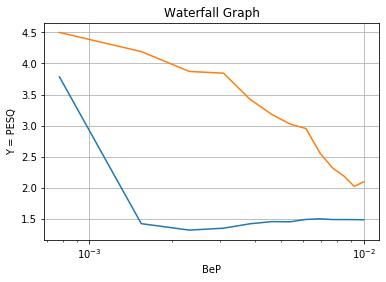

In [111]:
from scipy.stats import mode


# This methid is no longer used (majVote2 However it seems to slightly faster)
def majVote2(data1, data2, data3):
    counter = 0
    limit = len(data1)
    limit = int(np.round(limit))
    
    # Voting system
    for i in range(limit):
        vote1 = data1[i]
        vote2 = data2[i]
        vote3 = data3[i]
        # Mode of list = majority first value is data second is index
        winner = mode([vote1, vote2, vote3])
        winner = winner[0]
        data1[i] = winner
        counter += 1
        print("LOADING:", ((counter/(len(data1))*100)),"%")
    return data1


def majVote(data1, data2, data3):
    modeStack = np.vstack((data1,data2,data3))
    mostCommon = mode(modeStack)
    mostCommon = mostCommon[0]
    return mostCommon


logVar2 = 0.00001
logVariables2 = [0]*13
PESQScores2 = [0]*13

for i in range(13):
    speechBitArray = numpyint16array_to_bitarray(speech)
    speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)
    speechBitArrayErrors1 = insert_bit_errors(speechBitArray, logVar2)
    speechBitArrayErrors2 = insert_bit_errors(speechBitArray, logVar2)
    speechBitArrayErrors3 = insert_bit_errors(speechBitArray, logVar2)
    logVar2 = logVar2 + 0.000768461538462
    logVariables2[i] = logVar2

    print("After Majority Voting (takes a while after 2816016 iterations) takes around 5 minutes")
    y = majVote(speechBitArrayErrors1, speechBitArrayErrors2, speechBitArrayErrors3)  
    speechBack = bitarray_to_numpyint16array(y)
    Dp.display(Dp.Audio(speechBack,rate=Fs))
    wavfile.write("Majority.wav",Fs, speechBack)
    ! ./macos_pesq +8000 NarrobandSpeech8k.wav Majority.wav > /dev/null
    PESQScores2[i] = read_pesq_score() 
    print("PESQ:", PESQScores2[i])
    print("BeP:" + str(logVariables2[i]))
    
    
    

    #ADD PESQ SCORE AGAINTS BIT ERROR PROBABLLITY
  

    
# FOR 3.2 WITHOUT 3X majority voting
fig, ax0 = plt.subplots(1) 
ax0.plot(logVariables, PESQScores)
ax0.plot(logVariables, PESQScores2)
ax0.set_xscale('log')
ax0.set_xlabel("BeP") ; ax0.set_ylabel("Y = PESQ")
ax0.grid(True) ; ax0.set_title("Waterfall Graph")

# FOR 3.3 WIT 3X majority voting in orange






# FOR QUESTION 4
speechBitArray = numpyint16array_to_bitarray(speech)
speechBack = bitarray_to_numpyint16array(speechBitArrayErrors)
speechBitArrayErrors1 = insert_bit_errors(speechBitArray, bitError2)
speechBitArrayErrors2 = insert_bit_errors(speechBitArray, bitError2)
speechBitArrayErrors3 = insert_bit_errors(speechBitArray, bitError2)

y = majVote(speechBitArrayErrors1, speechBitArrayErrors2, speechBitArrayErrors3)  
speechBack = bitarray_to_numpyint16array(y)
Dp.display(Dp.Audio(speechBack,rate=Fs))
wavfile.write("PointTwo.wav",Fs, speechBack)
! ./macos_pesq +8000 NarrobandSpeech8k.wav PointTwo.wav > /dev/null
PESQScoresPointTwo = read_pesq_score() 
print("Question 4", PESQScoresPointTwo)








#### 1. When listening to the sound-bars, do you notice any improvement in narrow-band quality that is obtained at the expense of the 3-fold increase in transmitted bits.

Large improvement as scores are maintained at values of around 3.519 which without 3 fold is 1.366. However the time for computations is drastic

#### 2. To what extent does the combined PESQ graph agree with your perception of the speech quality?
Yes the speeech perception that i believe is almost the same there is a significant decrease in noise (crackling) many of the signals up until 0.01 are very easy to hear without loud noise.

#### 3. What is the effect of the 3-fold increase in transmitted bits on

#### (i) the transmit power and
You can decrease the transmit power and have a slightly higher BeP (EbN0 ratio)

#### (ii) the energy required to transmit the chosen section of narrowband speech?
However each bit is transmitted 3 times therefore 3x the energy is used.

#### 4. What is the energy required and the PESQ score obtained with FEC when the transmit power is 1.2 watts?
1.2 roughly produces a bit error of 7.451167896213846e-06 the PESQ score is 4.5 which is Higher obtained for it without FEC. (it was 4.088) The energy required


#### 5. If we now reduce the transmit power by a factor of 3 from 1.2 watts to 0.4 watts, how will the energy for the speech transmission be affected? [Show that the value of Eb/N0 reduces by 10xlog10(3) = 4.8 dB, and remember this mathematical trick in future].
#### Calculate the new value of Eb/N0 and demonstrate the speech quality obtained for the (3,1) rep coder with this new value of Eb/N0.

As calculated in the box below Jpersec/bitspersec divided by power loss (here 9.6*10^-7) from 4.8dB
Energy for speech is now 7.812498232997779e-06 joules per bit. This is Eb

Therefore the new Eb/No is see box below



#### 6. What other method could be used to reduce the energy required to transmit the speech sentence without reducing the energy per bit? Think about previous lectures.

Run length encoding

In [149]:
Eb =(0.4/(128*10**3)) / 10**5
print(Eb)
# Calculate Eb, energy per bit = Power(JS^-1)/ Bits per second  then divide this by the power loss

EbN0 = Eb/(10*10**-12)

#The result of EbN0 Is roughly 3.1 (before it was 9.375) Therefore it has reduced by a factor of 3
print(EbN0)


EbN0DBBefore = 10*np.log10(9.375) 
print("Before", EbN0DBBefore)

# EbN0 is now
EbN0DBNow = 10*np.log10(EbN0) 
print("After", EbN0DBNow)

print("Difference", (EbN0DBBefore-EbN0DBNow))
#Which is the same as 10log(3) = 4.8
# So infuture instead of recalcuating EbN0 just use 10log(reducing factor) and subtract this from your initial EbN0 (inDb)






3.125e-11
3.1250000000000004
Before 9.719712763997565
After 4.948500216800941
Difference 4.771212547196624


#### Expt 3.4 Apply ARQ to a text message

In [8]:
ASCstring = b"Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets."


def asciiString_to_bitarray(bytestring):
    try:
        BA = np.unpackbits(bytearray(bytestring))
    except:
        BA = np.unpackbits(bytearray(bytestring,'latin1'))
    return BA

# Example for asciiString_to_bitarray
ASCbitarray = asciiString_to_bitarray(ASCstring)



# Function checkCRC for performing a CRC check
import numpy as np
def checkCRC(xa,gx) :
    # Generates M-bit CRC as row-vector where length of gx is (M+1)
    # Generator polynomial of order M is represented by gx(0:M)
    # Message is bit-array xa(0:L)
    M = len(gx)-1
    # print("M = ", M)
    xsa = np.copy(xa[0:M+1]) # Note this change
    for i in range (0 , len(xa) -(M)):
        xsa[M] = xa[i + M]
        if xsa[0] == gx[0]:
            xsa = xsa ^ gx 
        xsa[0:M] = xsa[1:M+1]
        # print(i, "xsa: ", xsa)
    return xsa[0:M]


def bitarray_to_asciiString(bitarray):
    NA=np.packbits(bitarray)
    NA=NA.tobytes()
    NA=NA.decode('latin1')
    return NA


gx = [1,0,0,0,0,0,1,1,1]
senderCheck = checkCRC(ASCbitarray, gx)
print ("check = ", senderCheck, type(senderCheck[1]))


logVar = 0.0001
for i in range(4):
    print("------------------")
    #This part simulates the transition
    ASCBitArrayErrors = insert_bit_errors(ASCbitarray, logVar)
    print("ASCII - With Bit Errors, :", logVar, " - Probability")
    logVar = logVar * 10
    print(logVar)
    ASCBack = bitarray_to_asciiString(ASCBitArrayErrors)
    print(ASCBack)
    recieverCheck = checkCRC(ASCBitArrayErrors, gx)
    CRCresult = np.array_equal(senderCheck, recieverCheck)
    print(CRCresult)

    counter = 1
    while CRCresult == False and (counter <= 9):
        print("Failed Transmission, Retrying: ", counter)
        counter += 1
        ASCbitarray = asciiString_to_bitarray(ASCstring)
        ASCBitArrayErrors = insert_bit_errors(ASCbitarray, logVar)
        recieverCheck = checkCRC(ASCBitArrayErrors, gx)
        CRCresult = np.array_equal(senderCheck, recieverCheck)

        
        if CRCresult == True:
            print("ARQ Re-transmission, CRC Successful on try - but is the string correct?: ", counter)
            counter = 0
            ASCBack = bitarray_to_asciiString(ASCBitArrayErrors)
            print(ASCBack)
            
        if counter > 9:
            print("Abandoning ARQ")
        
        
    print("------------------")    
        
        
    

    
    
    
    








check =  [0 1 0 0 1 0 0 1] <class 'numpy.int64'>
------------------
ASCII - With Bit Errors, : 0.0001  - Probability
0.001
Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.
True
------------------
------------------
ASCII - With Bit Errors, : 0.001  - Probability
0.01
Uncorrected bit-errors should never be allowed to affect email transmissions, text messages, documents and spreadsheets.
True
------------------
------------------
ASCII - With Bit Errors, : 0.01  - Probability
0.1
Uncorrected(bit­errors should never be allowed to affect e}ail transmicsinns, text messages, documents and spreadsheets.
False
Failed Transmission, Retrying:  1
Failed Transmission, Retrying:  2
Failed Transmission, Retrying:  3
Failed Transmission, Retrying:  4
Failed Transmission, Retrying:  5
Failed Transmission, Retrying:  6
Failed Transmission, Retrying:  7
Failed Transmission, Retrying:  8
Failed Transmission, Retrying:  9
Abandoning A

#### 1. If the CRC check succeeds, can we deduce that there are no bit-errors? Briefly explain your answer.
If it succeeds then one of two scenarios has occured. 
1 The string has not changed therefore the outputs for reciever/sender crc are the same. 

2 The string has changed but the CRC output has not this occurs when the CRC output has changed by a multiple of g(x)

#### 2. If the CRC check fails, can we deduce that there are some bit-errors? Briefly explain your answer. 

Yes there should always be the same output if none of the original bits have changed


#### 3. Explain how your results demonstrate the effect of evenly distributed bit-errors and ARQ with various values of bit-error probability.

Errors above the bit error probablity of 0.01 tend to always fail. Practicallty the effect may make the string only unreadable at certain parts. 

#### 4. For what values of bit-error probability did the ARQ process fail completely after 9 transmissions?
0.01

#### 5. If the CRC check fails for the first three transmissions, does it appear likely, from your experiments, that a further retransmission will be successful?

No.

#### 6. If a message has about 125 characters represented by 1000 bits, the probability that it will be received correctly in one transmission if beP = 0.001 will be 0.9991000 What is the probability that it will not be received correctly after 5 transmissions?

SEE BOX BELOW 5.90490000000039e-16


In [150]:
Pa = 1 - 0.9991000 # Chance of it not being recieved correctly
Pa = Pa**5 #Prob A happening 3 times is A.A.A etc
print(Pa)

5.90490000000039e-16


#### Expt 3.5: Applying a modified form of ARQ to a text message (CHASE COMBINING)

In [109]:
#Create CRC For each signal
gx = [1,0,0,0,0,0,1,1,1]
ASCbitarray = asciiString_to_bitarray(ASCstring)
ASCbitarraySegs = np.split(ASCbitarray, 4)
ASCchecks = [0]*4

    
def majVote(data1, data2, data3):
    modeStack = np.vstack((data1,data2,data3))
    mostCommon = mode(modeStack)
    mostCommon = mostCommon[0]
    return mostCommon



errorProb = 0.07
for i in range(3):
    complete = False
    currentSegment = ASCbitarraySegs[i]
    currentSegmentPrint = bitarray_to_asciiString(currentSegment)
    currentCheck = checkCRC(ASCbitarraySegs[i], gx)

    
    print("┏━━━━━━━━━━━━━━━┓")
    print("Transmission of Segment:", i+1)
    
    x = 0
    failedTransmissions = [0]*3
    for i in range(3):
        if complete == True:
            print("Transmission Successfully Transmitted within 3 Attempts")
            print("\n")
            
        if complete != True:                      
            #This part simulates the transmission again for retransmission
            ASCBitArrayErrors = insert_bit_errors(currentSegment, errorProb)
            

            # Convert to string for later / human check
            ASCBack = bitarray_to_asciiString(ASCBitArrayErrors)

            #Cyclic Redun. Check
            recieverCheck = checkCRC(ASCBitArrayErrors, gx)
            # print(recieverCheck, "early CRC CHECK")
            CRCresult = np.array_equal(currentCheck, recieverCheck)
            
            # IF retransmission passes CRC, then no need to start again
            if CRCresult == True:
                complete = True
                
            
            # If it failed    
            print("Re/Transmission: ", i+1, "/3  | Result = ", CRCresult)
            if CRCresult == False:
                failedTransmissions[x] = ASCBitArrayErrors
                x += 1
            
            # If it failed and on final attempt
            if ((CRCresult == False) and (i==2)):
                x = 0
                print("! Failed After Three Re-transmissions")
                
                #Combine the three failed transmissions
                combined = majVote(failedTransmissions[0], failedTransmissions[1], failedTransmissions[2])
                
                #Cyclic Redun. Check
                combined = combined.reshape((240))
                CombinedCheck = checkCRC(combined, gx)
                
                
                # Convert combination to string for later
                combinedPrint = bitarray_to_asciiString(combined)
                
            

                ## Now look at the results of the chase combining
                print("\n")
                print("Failed Transmissions were... ")
                print(bitarray_to_asciiString(failedTransmissions[0]))
                print(bitarray_to_asciiString(failedTransmissions[1]))
                print(bitarray_to_asciiString(failedTransmissions[2]))
                
                print("\n")
                print("Chase Combined Transmissions Result... ", combinedPrint)
         
                

                
                #Compare CRC now from the combined
                CRCresult = np.array_equal(currentCheck, CombinedCheck)

                if CRCresult == True:   
                    print("Therefore Chase Combined Failures has fixed issue ✓✓✓")
                    print("\n")
                else:
                    print("Therefore Chase Combined Failures has NOT fixed issue ✕✕✕")
                    print("\n")
          
  
    

┏━━━━━━━━━━━━━━━┓
Transmission of Segment: 1
Re/Transmission:  1 /3  | Result =  False
Re/Transmission:  2 /3  | Result =  False
Re/Transmission:  3 /3  | Result =  False
! Failed After Three Re-transmissions


Failed Transmissions were... 
uncorreatee bhp-eórorñ q`muld¨
ÕncOrbuetEd fk|-erzobswho}l$ 
Ulcorvectmd bit­erposb sjcõld 


Chase Combined Transmissions Result...  Uncorreated bit-errors should 
Therefore Chase Combined Failures has NOT fixed issue ✕✕✕


┏━━━━━━━━━━━━━━━┓
Transmission of Segment: 2
Re/Transmission:  1 /3  | Result =  False
Re/Transmission:  2 /3  | Result =  False
Re/Transmission:  3 /3  | Result =  False
! Failed After Three Re-transmissions


Failed Transmissions were... 
nezg~ "E Alìgweô tO agf ct e-a
Ndte"  !%c}moväd to afÆI`t eMa
neÖer cå0allo_ed(rï cdgegE doa


Chase Combined Transmissions Result...  never "e allowed to affact ema
Therefore Chase Combined Failures has NOT fixed issue ✕✕✕


┏━━━━━━━━━━━━━━━┓
Transmission of Segment: 3
Re/Transmission:  1 /

### 1. What could the ARQ mechanism above do if a numerical or string array is received correctly but bit-errors have occurred in the CRC check-bits? How often might this occur?

It may specifcy which segment of the bit data needs to be pinpointed for retransmission. This may occur with Interleaving which is where bit errors occur in burts.

### 2. State whether you consider ARQ as used in Expt 3.4 an efficient method, and explain the reasons for your answer.

Yes it manages to fix the broken message by consulting otherwise wasted transmissions. It may slow the bitrate bit it provides better results for 0.01 bep which ARQ is not able to recover the signal from just requesting transmission again

### 3. Explain your mechanism for combining failed retransmissions.

Majority Voting between the failed transmissions. Within each segment. It is essentially like sending each bit 3 times as the signal/noise ratio is increased by 3

### 4. Demonstrate the effect of combining 3 failed transmissions.

As shown from many runs you can see how the string recoveres from the 3 failed transmissions to a chase combined result (if ticks means it was successfull if crosses, the latter)

### 5. At what value of beP does the new ARQ process fail completely? Is there any improvement over what we got before?
Despite having the chance of some 'passes' in which the CRC value is correct yet the string isnt (due to multiples of the generator potential being the error) The highest bep In which it fails completely when trying to recombine is 0.07< As Some segments show signs of recovering after this point. This is a great improvement to before as before bep 0.01< would cause a failure. ie 7fold increase.


### 6. If combining failed transmissions turns out to be a good idea, why is it not used in practice, for example in wifi (you need to look this up).

Hybrid Methods exist such as Hybrid ARQ in which extra bits (parity bits) are sent in order, The combined error correction is normally only a fallback. 

Within these extra bits is a more complex FEC code which allows to incrementally puncture (selectivly pick 'bits' of the signal) and overtime the signal is constructed

Incremental ARQ Hybrid will improve poor signal conditions, however as more is sent it will lower throughput in good signal conditions.